# Chapter 3: synthetic data study
# Parameter Tests $\lambda$ and $a$


<div class="alert alert-success">
    
This Notebook contains the Code to produce Figures related to the parameter tests of ET and SRT method.

In [1]:
# Importing pygimli
import  pygimli                 as     pg
import  pygimli.meshtools       as     mt
from    pygimli.physics         import ert
from    pygimli.physics         import TravelTimeManager
from    pygimli.viewer.mpl      import createColorBarOnly
from    JointEntropyClass       import JointEntropyInversion as JEI

# Importing auxiliary libraries
import  numpy                   as     np
import  matplotlib.pyplot       as     plt
import  sys

# Setting options
seed_val = 420
np.random.seed(seed_val)

# Filenames
fn_ert_dd  = 'C:/Users/azieg/Documents/GitHub/APG-MSc-Project-Ziegon/Data/Synthetic/Synth_ert_dd.dat'
fn_tt      = 'C:/Users/azieg/Documents/GitHub/APG-MSc-Project-Ziegon/Data/Synthetic/Synth_tt.dat'

# Plotting
c_ert = 'gnuplot'
c_srt = 'viridis'
lim_ert = [5e1, 1e4]
[r_left, r_right, r_back] = [7e1, 7e3, 7e2]
ert_label = ['Square', 'Circle', 'Half-space']

lim_srt = [300, 4200]
[v_left, v_right, v_layer1, v_layer2] = [3e3, 2e3, 5e2, 4e3]
srt_label = ['Square', 'Circle', 'Layer 1', 'Layer 2']

## Data and Inversion Mesh

In [4]:
# Loading ERT
ert_data = ert.load(fn_ert_dd)
ERT = ert.ERTManager(ert_data)

# Loading SRT
tt_data = pg.physics.traveltime.load(fn_tt)
SRT = TravelTimeManager(tt_data)

# inversion mesh
w = mt.createWorld([-65,-20], [65, 0])
for x in np.arange(-64,65,1):
    w.createNode([x,0])
invmesh = mt.createMesh(w,area=1.5)
extmesh = mt.appendTriangleBoundary(invmesh,xbound=100,ybound=100,marker=0)

# fig, ax = plt.subplots(1,3)
# ERT.showData(ert_data, ax=ax[0], cMap=c_ert)
# SRT.showData(tt_data, ax=ax[1], cMap=c_srt)
# pg.show(invmesh, ax=ax[2])

In [5]:
# Reference models
refmod_ert = pg.Vector(invmesh.cellCount(), 700) # homogenous 700Ohmm
refmod_srt = pg.Vector(invmesh.cellCount(), 1/500) # homogenous 500m/s in slowness

## Set order $q$ for following calculations

<div class="alert alert-success">
    
Change the $q$ accordingly, depending if you want to reproduce first or second order expressions.

In [6]:
q = 1

## ME ERT lambda and smoothing tests

In [8]:
a_list = [0, 25, 100]
lam_list = [1e-5, 1e-3, 1e-1] 
beta = 1e-10

r_me = []
tit  = []

for a in a_list:
    for lam in lam_list:
        ERT2 = ert.ERTManager(ert_data)
        Je = JEI(mgr_list=[ERT2], data_list=[ert_data], mesh=invmesh, order=q, beta=beta, smooth_factor=a)

        KWe = dict(lam=lam, verbose=False)
        Je.setKWInv([KWe])
        Je.setNames(['ERT'])
        Je.setMethodMesh(extmesh, 0)
        Je.setReferenceModel([refmod_ert])

        Je.runInversion('ME', maxIter=10, chi_limit=1)
        ERT2.showResultAndFit(cMap=c_ert)

        [r_est] = Je.getModels()
        
        r_me.append(r_est)
        tit.append(f'lam={lam}, a={a}')

03/11/23 - 10:32:13 - pyGIMLi - INFO - Found 2 regions.
03/11/23 - 10:32:13 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
03/11/23 - 10:32:13 - pyGIMLi - INFO - Creating forward mesh from region infos.


Starting Iteration 0...
... ERT


03/11/23 - 10:32:13 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
03/11/23 - 10:32:14 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
03/11/23 - 10:32:14 - pyGIMLi - INFO - Use median(data values)=619.288890298902
03/11/23 - 10:32:14 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]


Starting iteration 1...
Set JME weights for ERT with q=1, b=1e-10 and a=0


KeyboardInterrupt: 

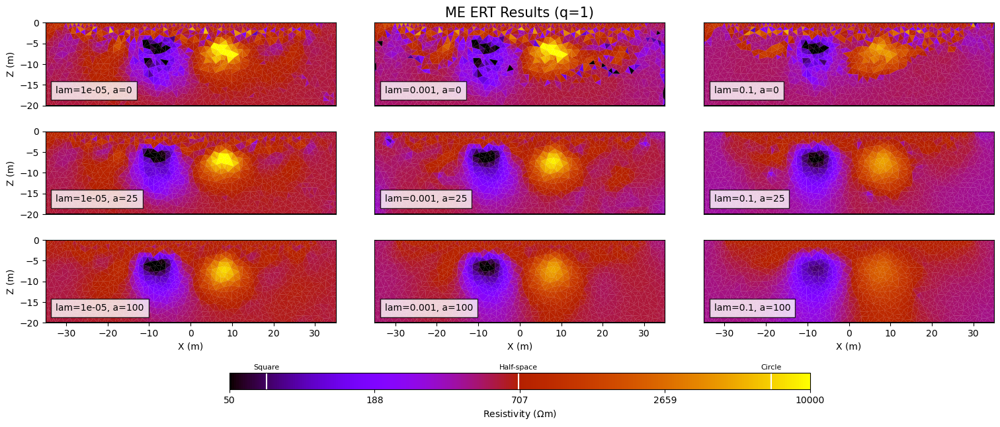

In [5]:
fig, ax = plt.subplots(3,3, figsize=(15,5))
fig.tight_layout(pad=0.5)
ax[0,1].set_title(f'ME ERT Results (q={q})', fontsize = 15)
for i in np.arange(3):
    for j in np.arange(3):
        pg.show(invmesh, r_me[i*3+j], ax=ax[i,j], 
                cMap=c_ert, cMin=lim_ert[0], cMax=lim_ert[1], 
                colorBar=False, logScale=True)
        
        ax[i,j].text(-32.5, -17, tit[i*3+j], fontsize=10,
                     bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
        ax[i,j].set_xlim(-35,35)
        ax[i,j].set_ylim(-20,0)

# Adjust axis labels
for axis in ax[:,0]:
    axis.set_ylabel('Z (m)')
for axis in ax[-1,:]:
    axis.set_xlabel('X (m)')
for axis_ar in ax[:2,:]:
    for axis in axis_ar:
        axis.set_xticks([])
for axis_ar in ax[:,1:]:
    for axis in axis_ar:
        axis.set_yticks([])

# Add colorbar
cax = ax[2,1].inset_axes([-0.5, -0.8, 2, 0.2])
createColorBarOnly(ax=cax, cMin=lim_ert[0], cMax=lim_ert[1], logScale=True,cMap=c_ert,
                  label=pg.unit('res'), orientation='horizontal')
for i, r in enumerate([r_left, r_right,r_back]):
    cax.plot([r]*2, [0,1], 'w')
    cax.text(r, 1.3, ert_label[i], fontsize=8, horizontalalignment='center', verticalalignment='center')
    
# plt.savefig(f'C:/Users/azieg/Desktop/GIT_repositories/APG-MSc-Project-Ziegon/Figures/Ch-4/Comp_ME_lam_a_q{q}_ERT.pdf', 
#             bbox_inches='tight',
#            dpi=600)

## ME SRT lambda and smoothing tests

31/05/23 - 20:41:55 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:41:55 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:41:55 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:41:55 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:41:55 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:41:55 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 635.83
#####     stabilizing functional    S = 4.45
#####     joint weighted misfit chi^2 = 635.83
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 303.27
#####     stabilizing functional    S = 7.88
#####     joint weighted misfit chi^2 = 303.27
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 154.11
#####     stabilizing functional    S = 5.22
#####     joint weighted misfit chi^2 = 154.11
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 53.87
##

31/05/23 - 20:43:13 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:43:13 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:43:13 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:43:13 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:43:13 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:43:13 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 636.61
#####     stabilizing functional    S = 4.43
#####     joint weighted misfit chi^2 = 636.61
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 309.01
#####     stabilizing functional    S = 7.88
#####     joint weighted misfit chi^2 = 309.01
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 141.18
#####     stabilizing functional    S = 7.41
#####     joint weighted misfit chi^2 = 141.18
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 51.90
##

31/05/23 - 20:44:45 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:44:45 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:44:45 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:44:45 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:44:45 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:44:45 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 1059.67
#####     stabilizing functional    S = 1.13
#####     joint weighted misfit chi^2 = 1059.67
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 288.94
#####     stabilizing functional    S = 3.77
#####     joint weighted misfit chi^2 = 288.94
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 42.68
#####     stabilizing functional    S = 8.89
#####     joint weighted misfit chi^2 = 42.68
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 14.80
##

31/05/23 - 20:46:58 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:46:58 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:46:58 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:46:58 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:46:58 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:46:58 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 607.09
#####     stabilizing functional    S = 4.47
#####     joint weighted misfit chi^2 = 607.09
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 280.07
#####     stabilizing functional    S = 8.05
#####     joint weighted misfit chi^2 = 280.07
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 127.46
#####     stabilizing functional    S = 7.10
#####     joint weighted misfit chi^2 = 127.46
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 36.8

31/05/23 - 20:48:40 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:48:40 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:48:40 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:48:40 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:48:40 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:48:40 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 157.41
#####     stabilizing functional    S = 10.38
#####     joint weighted misfit chi^2 = 157.41
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 84.74
#####     stabilizing functional    S = 5.10
#####     joint weighted misfit chi^2 = 84.74
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 52.27
#####     stabilizing functional    S = 12.36
#####     joint weighted misfit chi^2 = 52.27
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 16.24


31/05/23 - 20:51:04 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:51:04 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:51:04 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:51:04 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:51:04 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:51:04 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 150.99
#####     stabilizing functional    S = 23.43
#####     joint weighted misfit chi^2 = 150.99
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 74.05
#####     stabilizing functional    S = 3.37
#####     joint weighted misfit chi^2 = 74.05
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 42.19
#####     stabilizing functional    S = 25.01
#####     joint weighted misfit chi^2 = 42.19
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 23.43


31/05/23 - 20:53:30 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:53:30 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:53:31 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:53:31 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:53:31 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:53:31 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 274.98
#####     stabilizing functional    S = 3.50
#####     joint weighted misfit chi^2 = 274.98
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 64.01
#####     stabilizing functional    S = 9.41
#####     joint weighted misfit chi^2 = 64.01
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 39.75
#####     stabilizing functional    S = 4.69
#####     joint weighted misfit chi^2 = 39.75
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 21.2

31/05/23 - 20:55:10 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:55:10 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:55:10 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:55:10 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
31/05/23 - 20:55:10 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:55:10 - pyGIMLi - INFO - Setting starting model as reference!


Starting Iteration 0...
... SRT
Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 177.11
#####     stabilizing functional    S = 20.83
#####     joint weighted misfit chi^2 = 177.11
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 79.88
#####     stabilizing functional    S = 4.05
#####     joint weighted misfit chi^2 = 79.88
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 42.42
#####     stabilizing functional    S = 21.84
#####     joint weighted misfit chi^2 = 42.42
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 22

31/05/23 - 20:57:38 - pyGIMLi - INFO - Found 1 regions.
31/05/23 - 20:57:38 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:57:38 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
31/05/23 - 20:57:38 - pyGIMLi - INFO - Create gradient starting model. 500: 4500


Starting Iteration 0...
... SRT


31/05/23 - 20:57:38 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
31/05/23 - 20:57:38 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 118.85
#####     stabilizing functional    S = 68.10
#####     joint weighted misfit chi^2 = 118.85
############################################################
       
Starting iteration 2...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 40.06
#####     stabilizing functional    S = 7.02
#####     joint weighted misfit chi^2 = 40.06
############################################################
       
Starting iteration 3...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 12.98
#####     stabilizing functional    S = 7.33
#####     joint weighted misfit chi^2 = 12.98
############################################################
       
Starting iteration 4...
Set JME weights for SRT with q=2, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 5.77
#####     stabilizing function

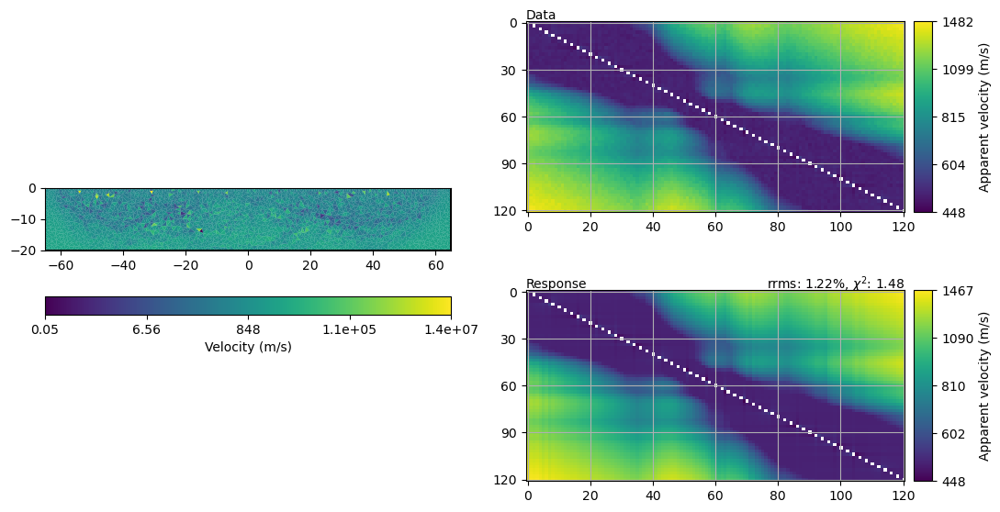

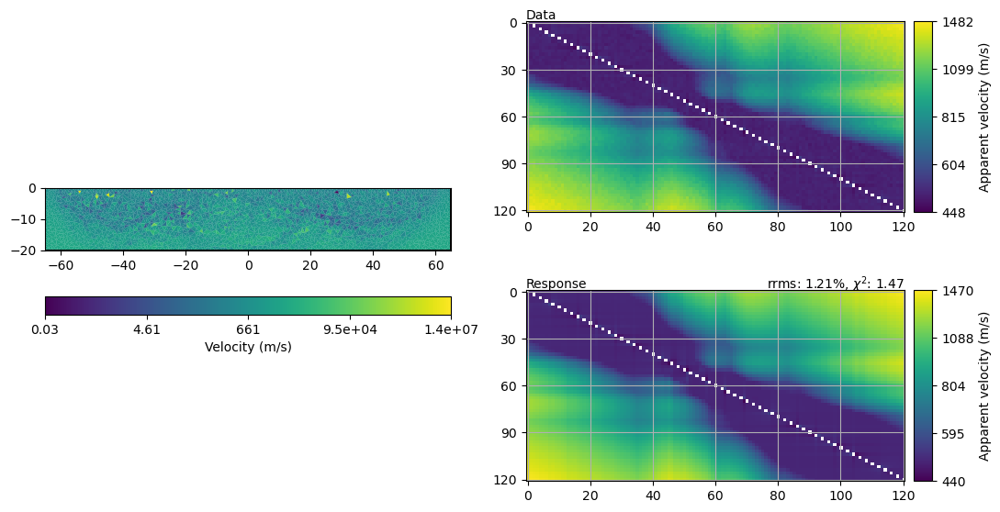

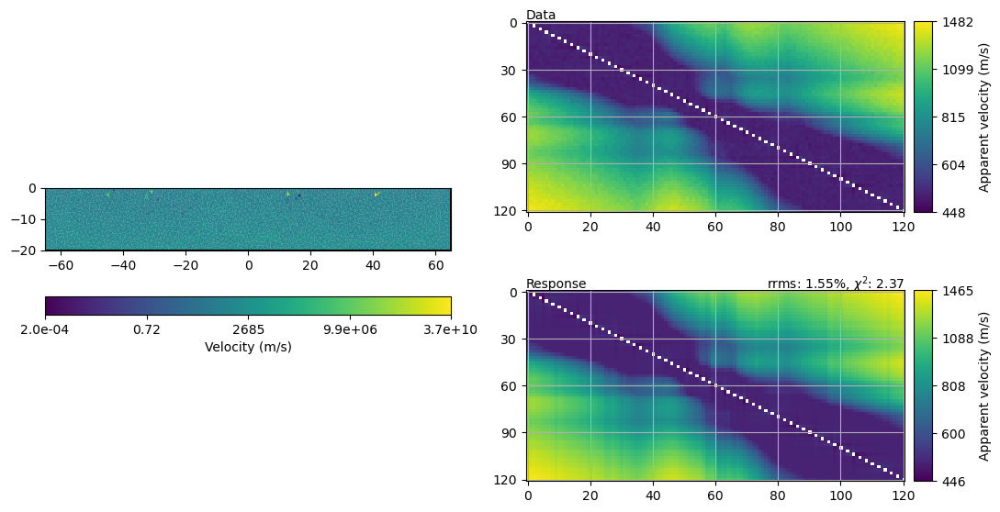

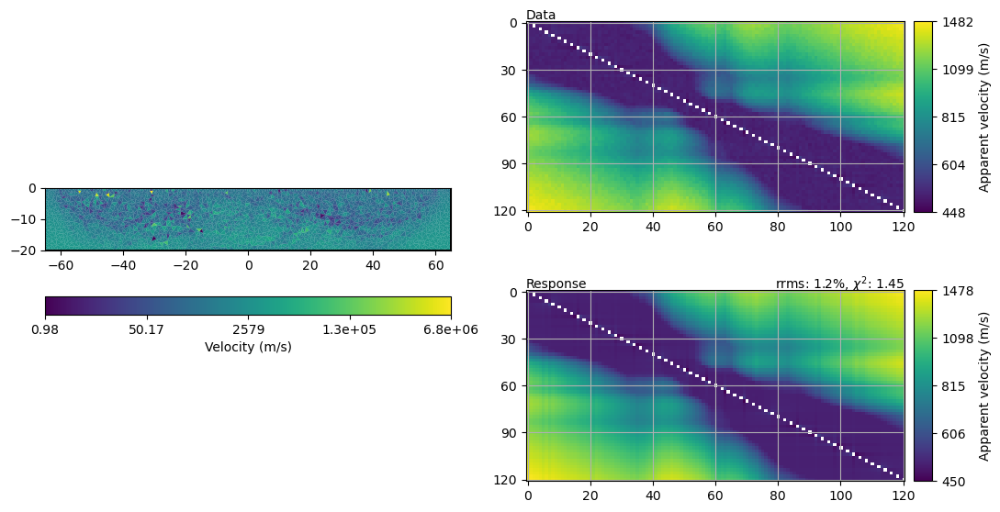

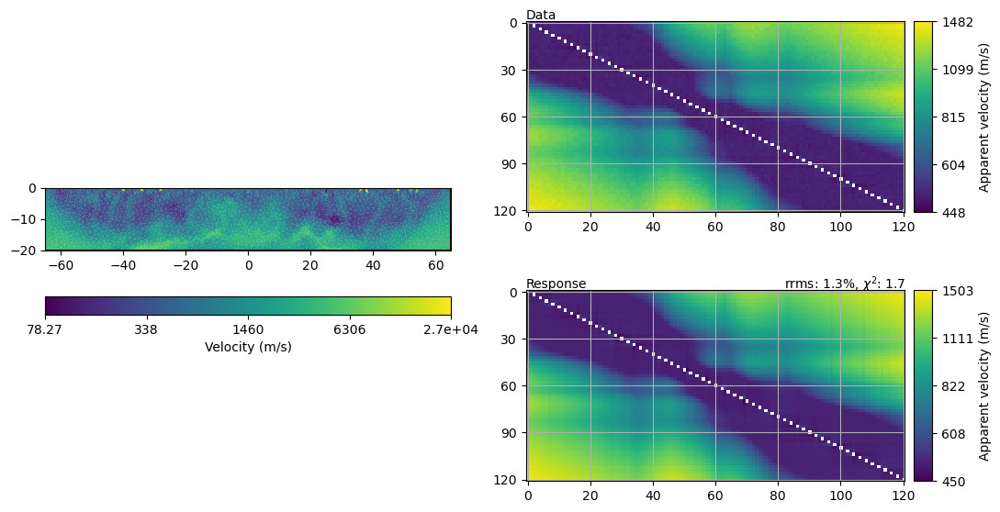

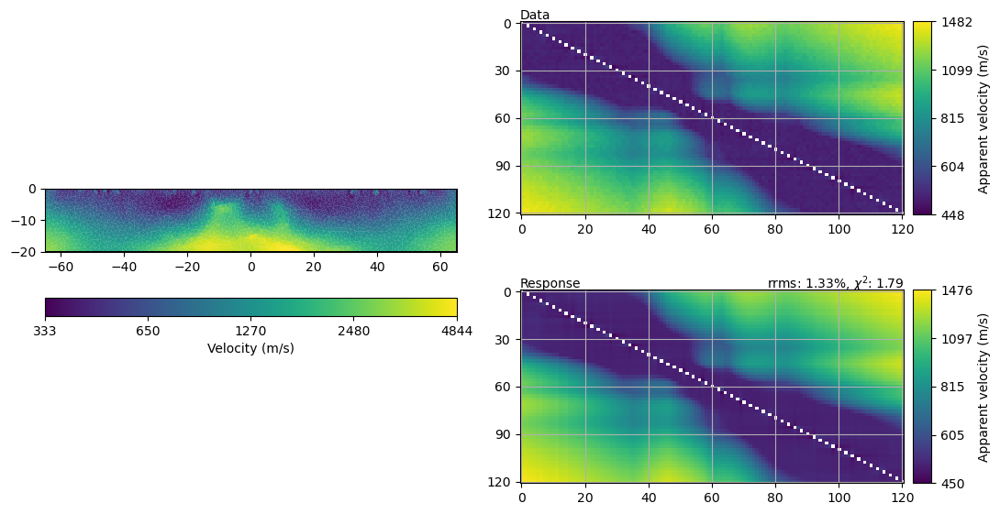

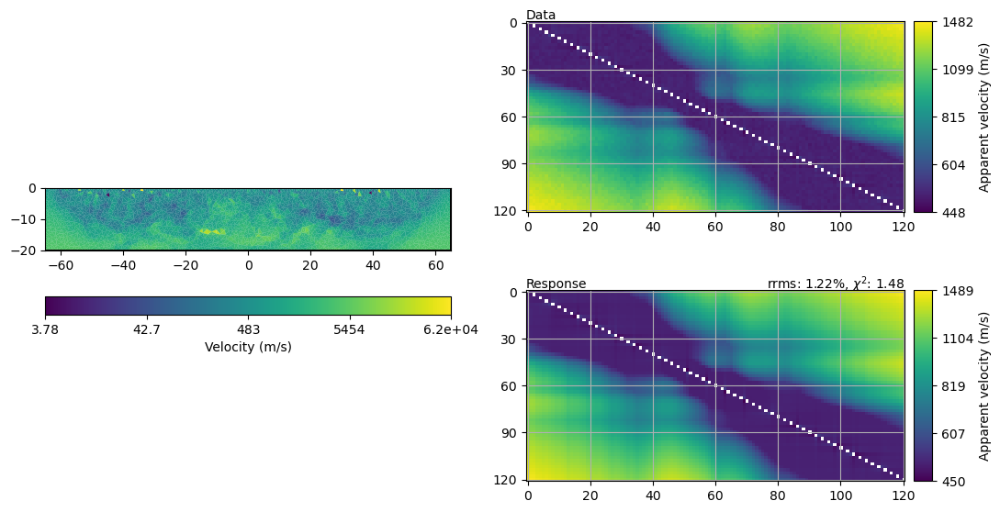

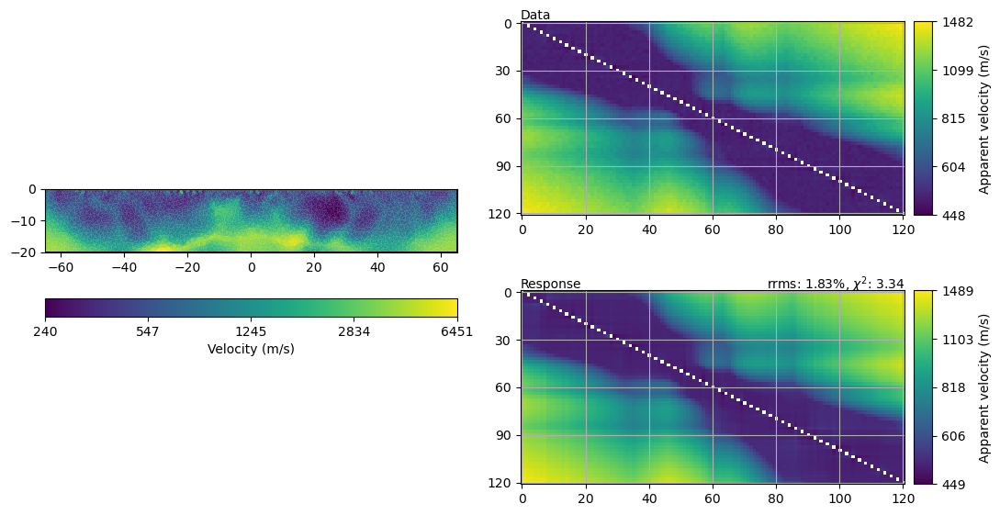

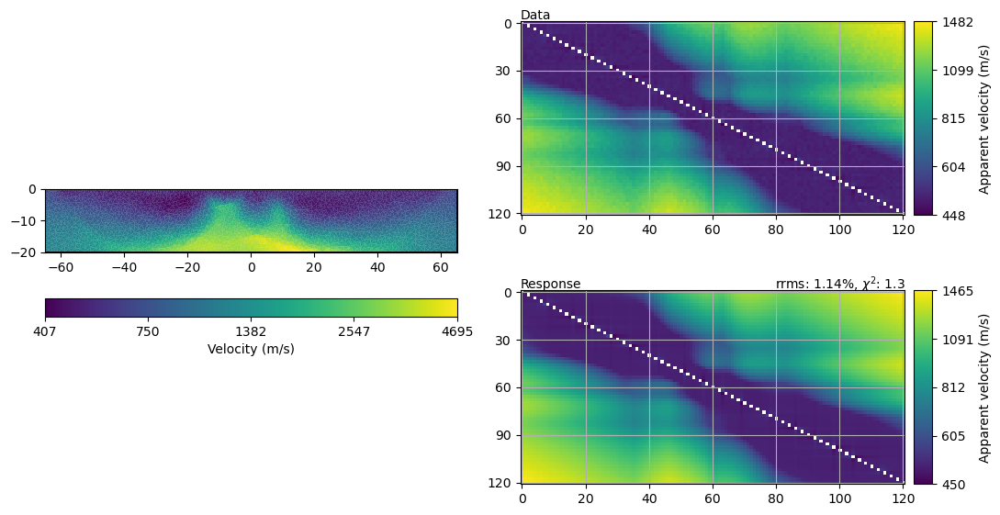

In [15]:
a_list = [0, 50, 200]
lam_list = [1e-5, 1e-3, 1e-1] 
beta = 1e-10

v_me = []
tit  = []

for a in a_list:
    for lam in lam_list:
        SRT2 = TravelTimeManager(tt_data)
        Js = JEI(mgr_list=[SRT2], data_list=[tt_data], mesh=invmesh, order=q, beta=beta, smooth_factor=a)

        KWs = dict(lam=lam, verbose=False, vTop=500, vBottom=4500, secNodes=1)
        Js.setKWInv([KWs])
        Js.setNames(['SRT'])
        
        Js.setReferenceModel([refmod_srt])

        Js.runInversion('ME', maxIter=20, chi_limit=1.5)
        SRT2.inv.model = 1/SRT2.inv.model
        SRT2.showResultAndFit(cMap=c_srt)

        [v_est] = Js.getModels()
        
        v_me.append(v_est)
        tit.append(f'lam={lam}, a={a}')

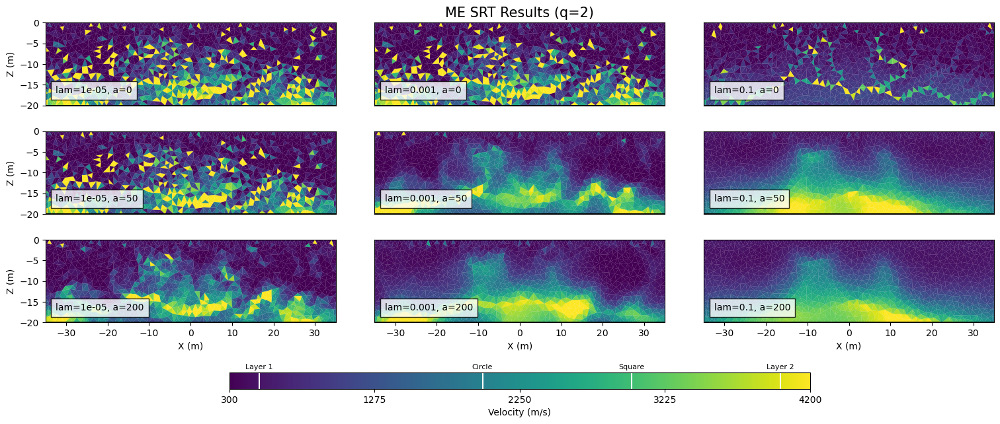

In [16]:
fig, ax = plt.subplots(3,3, figsize=(15,5))
fig.tight_layout(pad=0.5)
ax[0,1].set_title(f'ME SRT Results (q={q})', fontsize = 15)
for i in np.arange(3):
    for j in np.arange(3):
        pg.show(invmesh, v_me[i*3+j], ax=ax[i,j], 
                cMap=c_srt, cMin=lim_srt[0], cMax=lim_srt[1], 
                colorBar=False, logScale=False)
        
        ax[i,j].text(-32.5, -17, tit[i*3+j], fontsize=10,
                     bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
        ax[i,j].set_xlim(-35,35)
        ax[i,j].set_ylim(-20,0)

# Adjust axis labels
for axis in ax[:,0]:
    axis.set_ylabel('Z (m)')
for axis in ax[-1,:]:
    axis.set_xlabel('X (m)')
for axis_ar in ax[:2,:]:
    for axis in axis_ar:
        axis.set_xticks([])
for axis_ar in ax[:,1:]:
    for axis in axis_ar:
        axis.set_yticks([])

# Add colorbar
cax = ax[2,1].inset_axes([-0.5, -0.8, 2, 0.2])
createColorBarOnly(ax=cax, cMin=lim_srt[0], cMax=lim_srt[1], logScale=False,cMap=c_srt,
                  label=pg.unit('vel'), orientation='horizontal')
for i, v in enumerate([v_left, v_right, v_layer1, v_layer2]):
    cax.plot([v]*2, [0,1], 'w')
    cax.text(v, 1.3, srt_label[i], fontsize=8, horizontalalignment='center', verticalalignment='center')

# plt.savefig(f'C:/Users/azieg/Desktop/GIT_repositories/APG-MSc-Project-Ziegon/Figures/Ch-4/Comp_ME_lam_a_q{q}_SRT.pdf', 
#             bbox_inches='tight',
#             dpi=600)

# Additional Figigures: Minimum entropy Gradient

## MEG ERT lambda and smoothing tests


31/05/23 - 20:59:00 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 20:59:00 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 20:59:00 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 20:59:00 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 20:59:00 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 20:59:00 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 20:59:00 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 20:59:00 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 6.07
#####     stabilizing functional    S = 809105.30
#####     joint weighted misfit chi^2 = 6.07
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 1.45
#####     stabilizing functional    S = 540.04
#####     joint weighted misfit chi^2 = 1.45
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 1.40
#####     stabilizing functional    S = 14012.84
#####     joint weighted misfit chi^2 = 1.40
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 1.08
#####     stabilizing functional

31/05/23 - 21:02:04 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:02:04 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:02:04 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:02:05 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
31/05/23 - 21:02:05 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368


Starting Iteration 0...
... ERT


31/05/23 - 21:02:05 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:02:05 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:02:05 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 9.04
#####     stabilizing functional    S = 2936826.97
#####     joint weighted misfit chi^2 = 9.04
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 6.07
#####     stabilizing functional    S = 467605.05
#####     joint weighted misfit chi^2 = 6.07
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 4.44
#####     stabilizing functional    S = 55880.15
#####     joint weighted misfit chi^2 = 4.44
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 3.47
#####     stabilizing functi

31/05/23 - 21:07:38 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:07:38 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:07:38 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:07:38 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:07:39 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:07:39 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:07:39 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:07:39 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 43.16
#####     stabilizing functional    S = 192709.81
#####     joint weighted misfit chi^2 = 43.16
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 29.48
#####     stabilizing functional    S = 4038992.00
#####     joint weighted misfit chi^2 = 29.48
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 27.49
#####     stabilizing functional    S = 160811.53
#####     joint weighted misfit chi^2 = 27.49
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=0
#####     ERT weighted misfit chi^2   = 24.34
#####     stabilizin

31/05/23 - 21:13:33 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:13:33 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:13:33 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:13:33 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:13:34 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:13:34 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:13:34 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:13:34 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 6.06
#####     stabilizing functional    S = 813440.52
#####     joint weighted misfit chi^2 = 6.06
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 1.45
#####     stabilizing functional    S = 349.48
#####     joint weighted misfit chi^2 = 1.45
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 1.08
#####     stabilizing functional    S = 975.02
#####     joint weighted misfit chi^2 = 1.08
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 0.99
#####     stabilizing function

31/05/23 - 21:16:01 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:16:01 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:16:01 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:16:01 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:16:01 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:16:01 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:16:01 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:16:01 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 8.49
#####     stabilizing functional    S = 2963887.89
#####     joint weighted misfit chi^2 = 8.49
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 6.50
#####     stabilizing functional    S = 31052.24
#####     joint weighted misfit chi^2 = 6.50
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 5.14
#####     stabilizing functional    S = 36562.63
#####     joint weighted misfit chi^2 = 5.14
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 4.13
#####     stabilizing fun

31/05/23 - 21:22:06 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:22:06 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:22:06 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:22:06 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:22:06 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:22:06 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:22:06 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:22:06 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 20.38
#####     stabilizing functional    S = 2081263.05
#####     joint weighted misfit chi^2 = 20.38
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 11.45
#####     stabilizing functional    S = 59972.15
#####     joint weighted misfit chi^2 = 11.45
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 4.13
#####     stabilizing functional    S = 142049.62
#####     joint weighted misfit chi^2 = 4.13
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=25
#####     ERT weighted misfit chi^2   = 3.53
#####     stabilizin

31/05/23 - 21:27:54 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:27:54 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:27:54 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:27:54 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:27:54 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:27:54 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:27:54 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:27:54 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 5.92
#####     stabilizing functional    S = 798403.17
#####     joint weighted misfit chi^2 = 5.92
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 1.43
#####     stabilizing functional    S = 3577.92
#####     joint weighted misfit chi^2 = 1.43
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 1.09
#####     stabilizing functional    S = 99562.24
#####     joint weighted misfit chi^2 = 1.09
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 0.99
#####     stabilizing f

31/05/23 - 21:30:28 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:30:28 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:30:28 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:30:29 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:30:29 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:30:29 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:30:29 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:30:29 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 6.23
#####     stabilizing functional    S = 2980238.10
#####     joint weighted misfit chi^2 = 6.23
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 4.54
#####     stabilizing functional    S = 1208006.23
#####     joint weighted misfit chi^2 = 4.54
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 2.70
#####     stabilizing functional    S = 127808.74
#####     joint weighted misfit chi^2 = 2.70
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 2.23
#####     stabiliz

31/05/23 - 21:35:08 - pyGIMLi - INFO - Found 2 regions.
31/05/23 - 21:35:08 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (0) set to background.
31/05/23 - 21:35:08 - pyGIMLi - INFO - Creating forward mesh from region infos.
31/05/23 - 21:35:08 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.


Starting Iteration 0...
... ERT


31/05/23 - 21:35:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7632 Cells: 14948 Boundaries: 11368
31/05/23 - 21:35:08 - pyGIMLi - INFO - Use median(data values)=619.288890298902
31/05/23 - 21:35:08 - pyGIMLi - INFO - Created startmodel from forward operator: 2979 [619.288890298902,...,619.288890298902]
31/05/23 - 21:35:08 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 17.34
#####     stabilizing functional    S = 2481651.30
#####     joint weighted misfit chi^2 = 17.34
############################################################
       
Starting iteration 2...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 16.08
#####     stabilizing functional    S = 182118.45
#####     joint weighted misfit chi^2 = 16.08
############################################################
       
Starting iteration 3...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 11.82
#####     stabilizing functional    S = 43487.69
#####     joint weighted misfit chi^2 = 11.82
############################################################
       
Starting iteration 4...
Set JMEG weights for ERT with q=2, b=1e-10 and a=100
#####     ERT weighted misfit chi^2   = 4.32
#####     stab

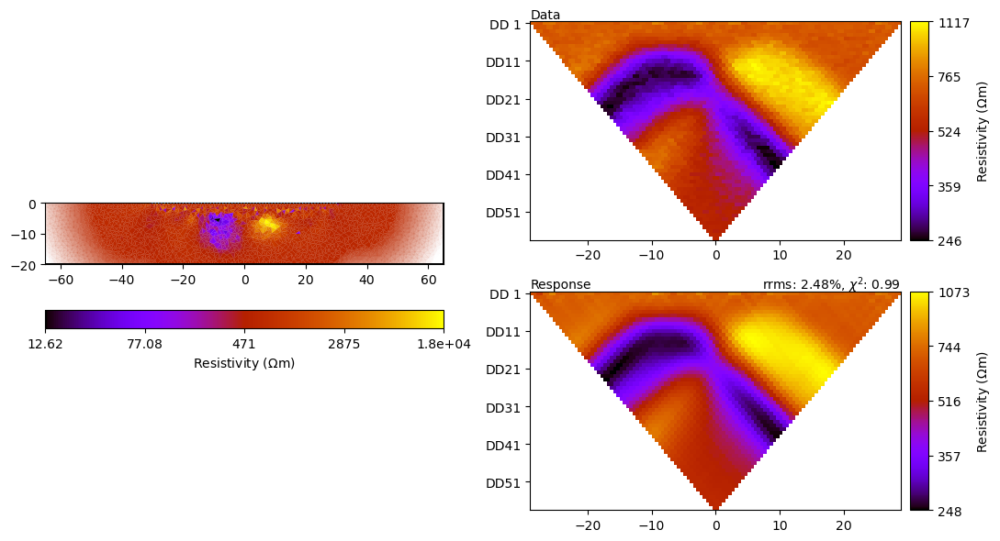

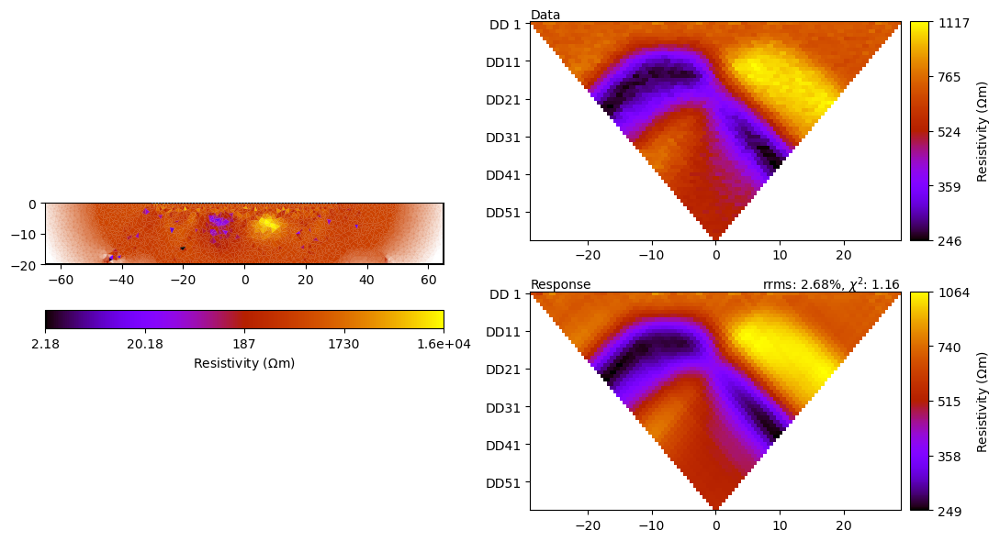

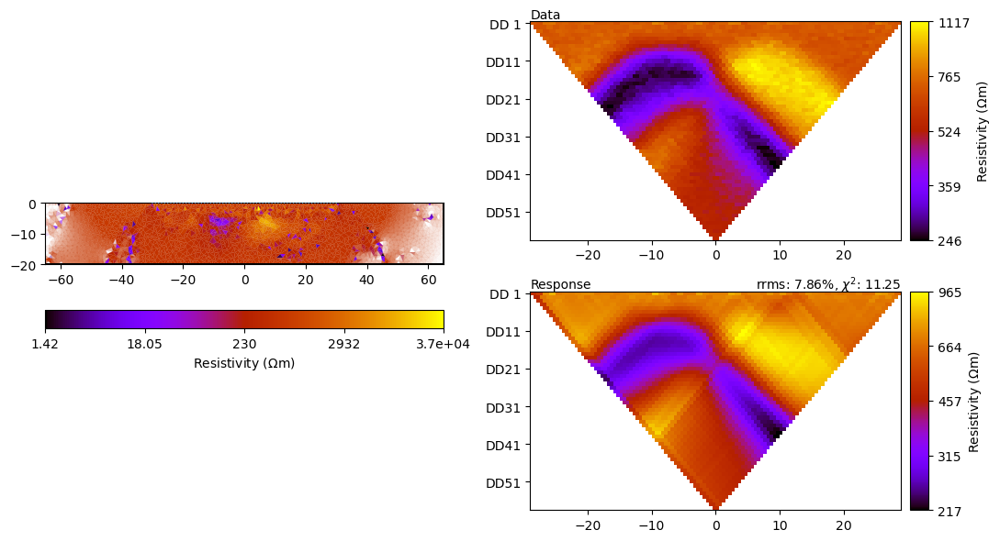

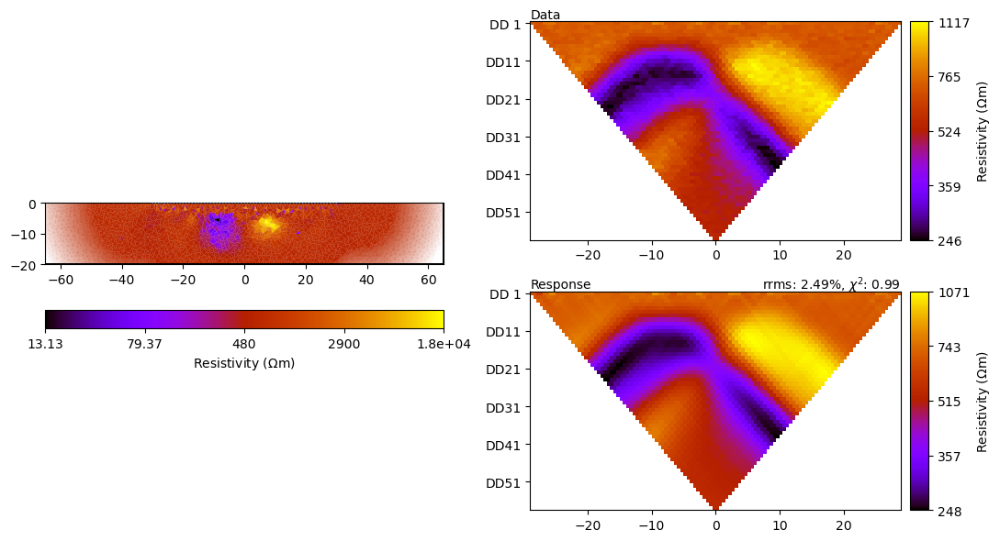

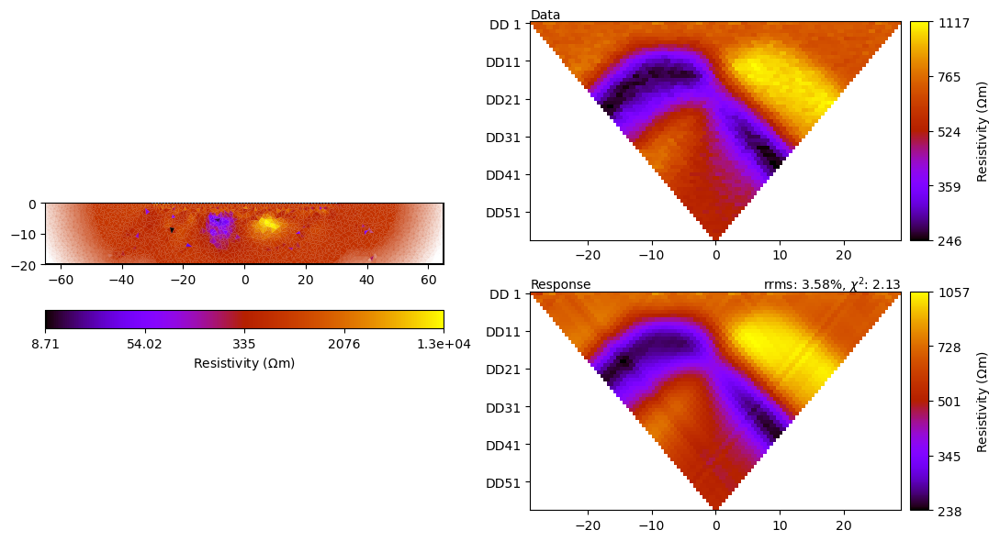

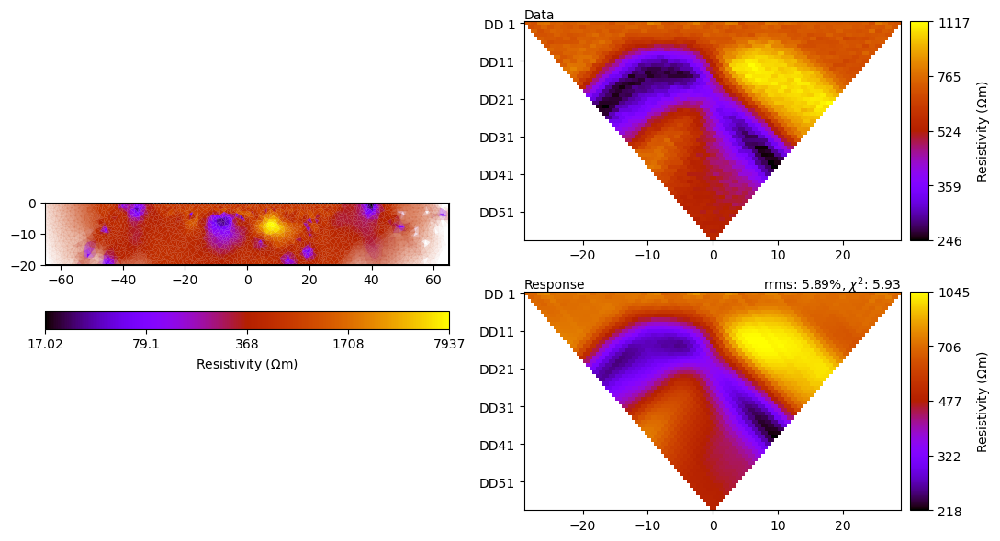

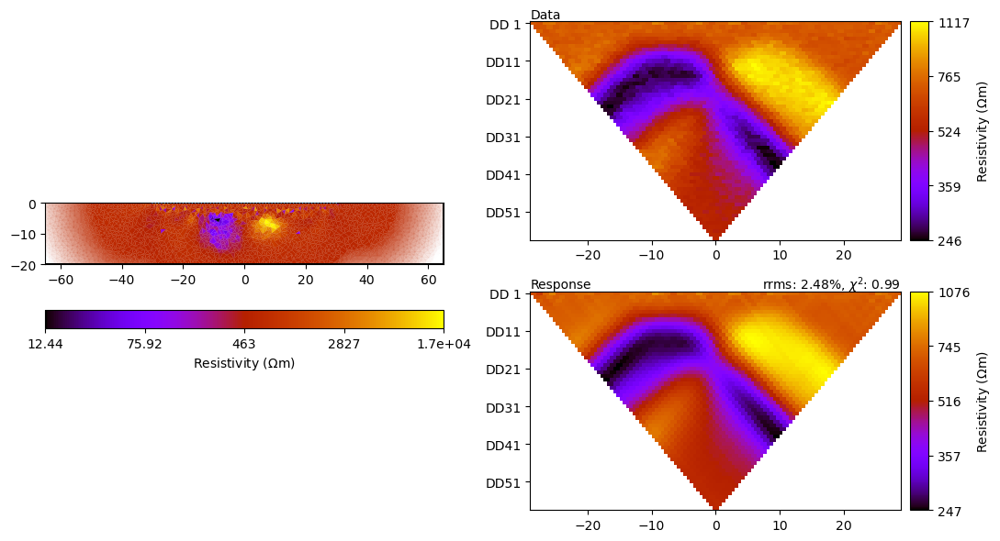

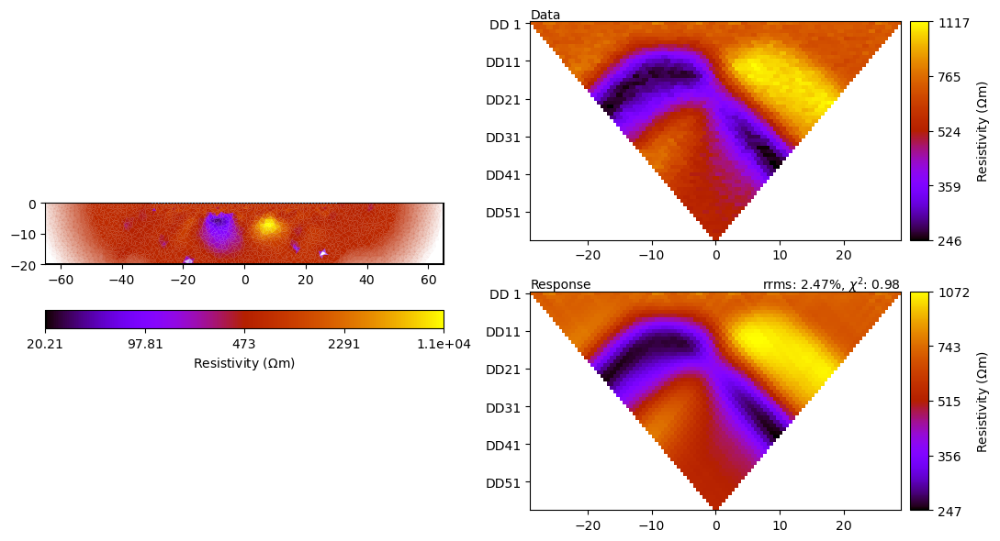

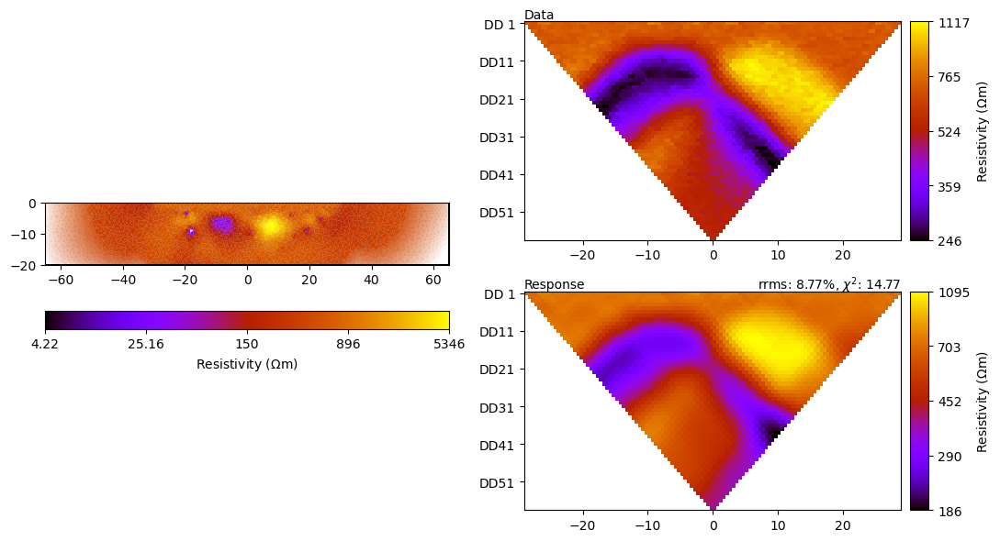

In [17]:
a_list = [0, 25, 100]
lam_list = [1e-7, 1e-5, 1e-3] 
beta = 1e-10

r_me = []
tit  = []

for a in a_list:
    for lam in lam_list:
        ERT2 = ert.ERTManager(ert_data)
        Je = JEI(mgr_list=[ERT2], data_list=[ert_data], mesh=invmesh, order=q, beta=beta, smooth_factor=a)

        KWe = dict(lam=lam, verbose=False)
        Je.setKWInv([KWe])
        Je.setNames(['ERT'])
        Je.setMethodMesh(extmesh, 0)
        
        Je.setReferenceModel([refmod_ert])

        Je.runInversion('MEG', maxIter=10, chi_limit=1)
        ERT2.showResultAndFit(cMap=c_ert)

        [r_est] = Je.getModels()
        
        r_me.append(r_est)
        tit.append(f'lam={lam}, a={a}')

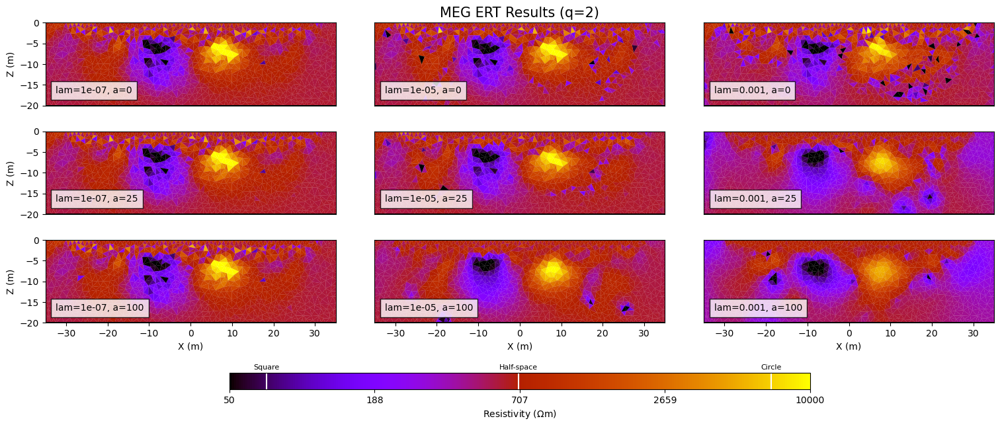

In [18]:
fig, ax = plt.subplots(3,3, figsize=(15,5))
fig.tight_layout(pad=0.5)
ax[0,1].set_title(f'MEG ERT Results (q={q})', fontsize = 15)
for i in np.arange(3):
    for j in np.arange(3):
        pg.show(invmesh, r_me[i*3+j], ax=ax[i,j], 
                cMap=c_ert, cMin=lim_ert[0], cMax=lim_ert[1], 
                colorBar=False, logScale=True)
        
        ax[i,j].text(-32.5, -17, tit[i*3+j], fontsize=10,
                     bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
        ax[i,j].set_xlim(-35,35)
        ax[i,j].set_ylim(-20,0)

# Adjust axis labels
for axis in ax[:,0]:
    axis.set_ylabel('Z (m)')
for axis in ax[-1,:]:
    axis.set_xlabel('X (m)')
for axis_ar in ax[:2,:]:
    for axis in axis_ar:
        axis.set_xticks([])
for axis_ar in ax[:,1:]:
    for axis in axis_ar:
        axis.set_yticks([])

# Add colorbar
cax = ax[2,1].inset_axes([-0.5, -0.8, 2, 0.2])
createColorBarOnly(ax=cax, cMin=lim_ert[0], cMax=lim_ert[1], logScale=True,cMap=c_ert,
                  label=pg.unit('res'), orientation='horizontal')
for i, r in enumerate([r_left, r_right,r_back]):
    cax.plot([r]*2, [0,1], 'w')
    cax.text(r, 1.3, ert_label[i], fontsize=8, horizontalalignment='center', verticalalignment='center')
    
# plt.savefig(f'C:/Users/azieg/Desktop/GIT_repositories/APG-MSc-Project-Ziegon/Figures/Ch-4/Comp_MEG_lam_a_q{q}_ERT.pdf', 
#             bbox_inches='tight',
#            dpi=600)

## MEG SRT lambda and smoothing tests

15/06/23 - 15:32:31 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:32:31 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:32:31 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
15/06/23 - 15:32:31 - pyGIMLi - INFO - Create gradient starting model. 500: 4500


Starting Iteration 0...
... SRT


15/06/23 - 15:32:31 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:32:31 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 912.12
#####     stabilizing functional    S = 555499199.12
#####     joint weighted misfit chi^2 = 912.12
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 368.37
#####     stabilizing functional    S = 25.30
#####     joint weighted misfit chi^2 = 368.37
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 123.66
#####     stabilizing functional    S = 15156.85
#####     joint weighted misfit chi^2 = 123.66
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 49.79
#####     stabili

15/06/23 - 15:34:44 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:34:44 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:34:44 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.


Starting Iteration 0...
... SRT


15/06/23 - 15:34:44 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
15/06/23 - 15:34:44 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:34:44 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 1195.51
#####     stabilizing functional    S = 58840930.97
#####     joint weighted misfit chi^2 = 1195.51
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 438.61
#####     stabilizing functional    S = 12057.31
#####     joint weighted misfit chi^2 = 438.61
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 144.90
#####     stabilizing functional    S = 41966.86
#####     joint weighted misfit chi^2 = 144.90
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 65.32
#####     sta

15/06/23 - 15:37:14 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:37:14 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:37:15 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
15/06/23 - 15:37:15 - pyGIMLi - INFO - Create gradient starting model. 500: 4500


Starting Iteration 0...
... SRT


15/06/23 - 15:37:15 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:37:15 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 1179.73
#####     stabilizing functional    S = 49651396.04
#####     joint weighted misfit chi^2 = 1179.73
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 543.29
#####     stabilizing functional    S = 46983.80
#####     joint weighted misfit chi^2 = 543.29
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 276.06
#####     stabilizing functional    S = 19773.49
#####     joint weighted misfit chi^2 = 276.06
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=0
#####     SRT weighted misfit chi^2   = 98.69
#####     sta

15/06/23 - 15:39:43 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:39:43 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:39:43 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
15/06/23 - 15:39:43 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
15/06/23 - 15:39:43 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]


Starting Iteration 0...
... SRT


15/06/23 - 15:39:43 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 183.47
#####     stabilizing functional    S = 568585525.87
#####     joint weighted misfit chi^2 = 183.47
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 144.47
#####     stabilizing functional    S = 1166.58
#####     joint weighted misfit chi^2 = 144.47
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 118.87
#####     stabilizing functional    S = 418.11
#####     joint weighted misfit chi^2 = 118.87
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 88.36
#####     sta

15/06/23 - 15:42:36 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:42:36 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:42:36 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.
15/06/23 - 15:42:36 - pyGIMLi - INFO - Create gradient starting model. 500: 4500


Starting Iteration 0...
... SRT


15/06/23 - 15:42:36 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:42:36 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 139.64
#####     stabilizing functional    S = 1457294988.78
#####     joint weighted misfit chi^2 = 139.64
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 80.68
#####     stabilizing functional    S = 1718.92
#####     joint weighted misfit chi^2 = 80.68
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 59.20
#####     stabilizing functional    S = 1463.37
#####     joint weighted misfit chi^2 = 59.20
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 42.82
#####     stabi

15/06/23 - 15:45:44 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:45:44 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:45:44 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.


Starting Iteration 0...
... SRT


15/06/23 - 15:45:44 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
15/06/23 - 15:45:44 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:45:44 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 6418.90
#####     stabilizing functional    S = 2409748779.03
#####     joint weighted misfit chi^2 = 6418.90
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 928.73
#####     stabilizing functional    S = 245.04
#####     joint weighted misfit chi^2 = 928.73
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 409.11
#####     stabilizing functional    S = 18695989.23
#####     joint weighted misfit chi^2 = 409.11
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=50
#####     SRT weighted misfit chi^2   = 306.82
#####

15/06/23 - 15:49:21 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:49:21 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:49:21 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.


Starting Iteration 0...
... SRT


15/06/23 - 15:49:21 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
15/06/23 - 15:49:22 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:49:22 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 132.28
#####     stabilizing functional    S = 416380668.73
#####     joint weighted misfit chi^2 = 132.28
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 94.10
#####     stabilizing functional    S = 471121.35
#####     joint weighted misfit chi^2 = 94.10
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 60.00
#####     stabilizing functional    S = 575.41
#####     joint weighted misfit chi^2 = 60.00
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 53.47
#####     s

15/06/23 - 15:54:19 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:54:19 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:54:19 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.


Starting Iteration 0...
... SRT


15/06/23 - 15:54:19 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
15/06/23 - 15:54:19 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:54:19 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 444.64
#####     stabilizing functional    S = 3712575148.06
#####     joint weighted misfit chi^2 = 444.64
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 185.59
#####     stabilizing functional    S = 173.11
#####     joint weighted misfit chi^2 = 185.59
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 152.46
#####     stabilizing functional    S = 27.90
#####     joint weighted misfit chi^2 = 152.46
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 108.02
#####    

15/06/23 - 15:58:13 - pyGIMLi - INFO - Found 1 regions.
15/06/23 - 15:58:13 - pyGIMLi - INFO - Creating forward mesh from region infos.
15/06/23 - 15:58:13 - pyGIMLi - INFO - Creating refined mesh (secnodes: 1) to solve forward task.


Starting Iteration 0...
... SRT


15/06/23 - 15:58:13 - pyGIMLi - INFO - Create gradient starting model. 500: 4500
15/06/23 - 15:58:13 - pyGIMLi - INFO - Created startmodel from forward operator: [0.00194971 0.0010641  0.00194971 ... 0.00023161 0.0002245  0.00024393]
15/06/23 - 15:58:13 - pyGIMLi - INFO - Setting starting model as reference!


Starting iteration 1...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 14455.71
#####     stabilizing functional    S = 5124380457.43
#####     joint weighted misfit chi^2 = 14455.71
############################################################
       
Starting iteration 2...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 2041.38
#####     stabilizing functional    S = 63.21
#####     joint weighted misfit chi^2 = 2041.38
############################################################
       
Starting iteration 3...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 1095.15
#####     stabilizing functional    S = 16029.64
#####     joint weighted misfit chi^2 = 1095.15
############################################################
       
Starting iteration 4...
Set JMEG weights for SRT with q=1, b=1e-10 and a=200
#####     SRT weighted misfit chi^2   = 1055.0

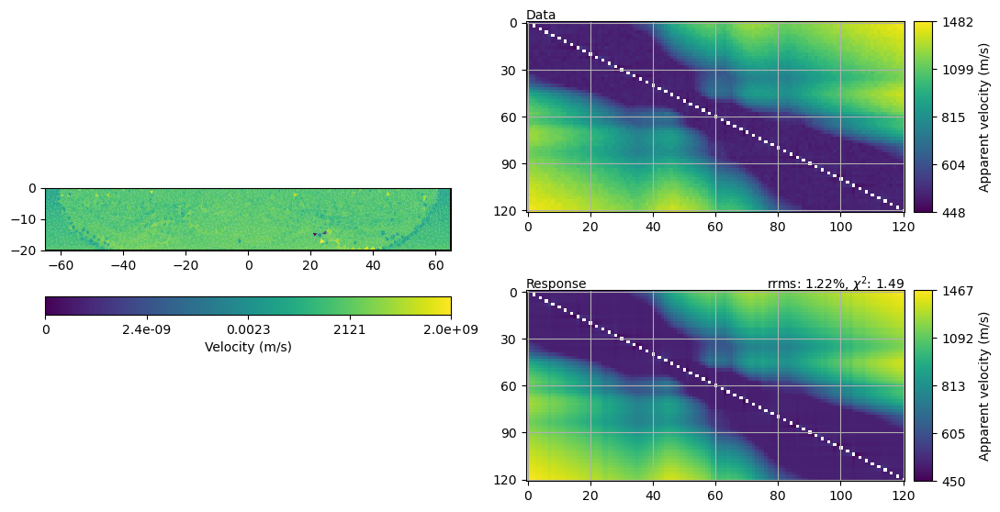

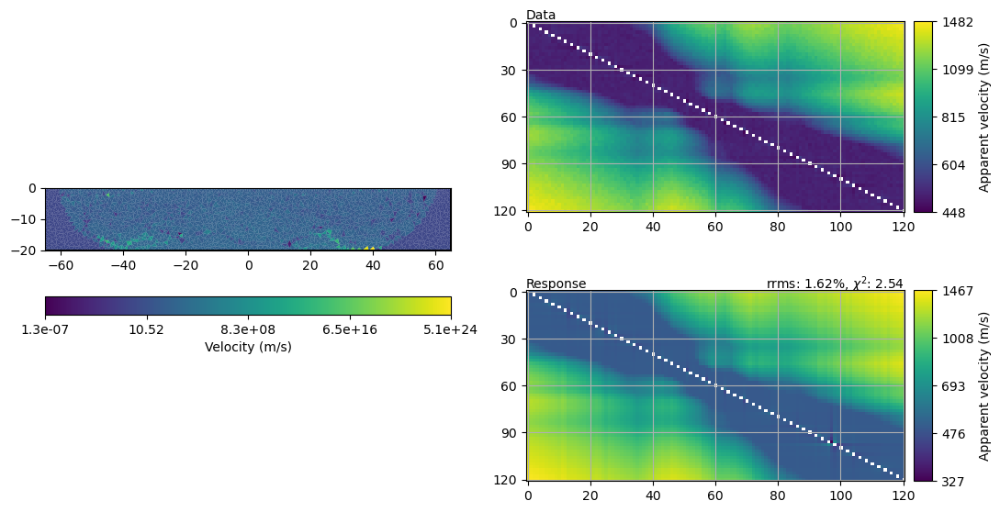

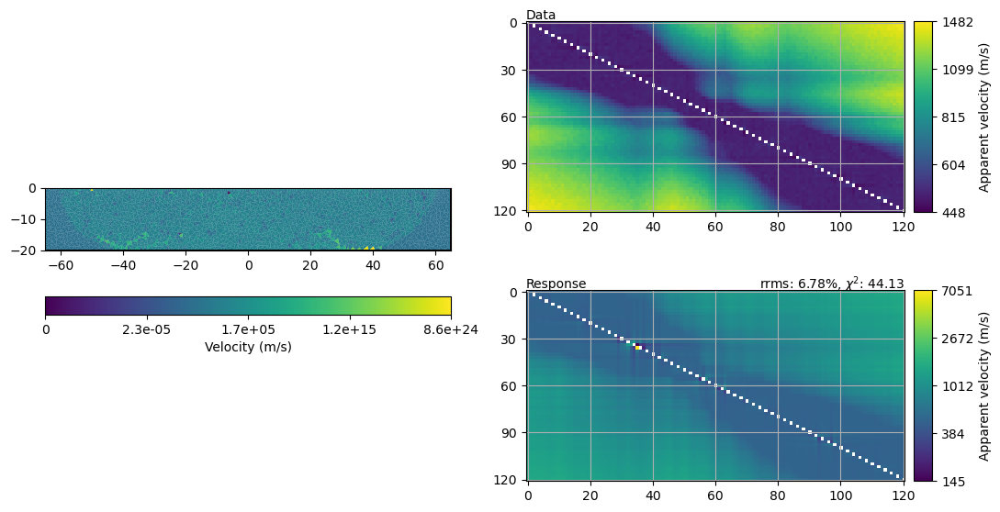

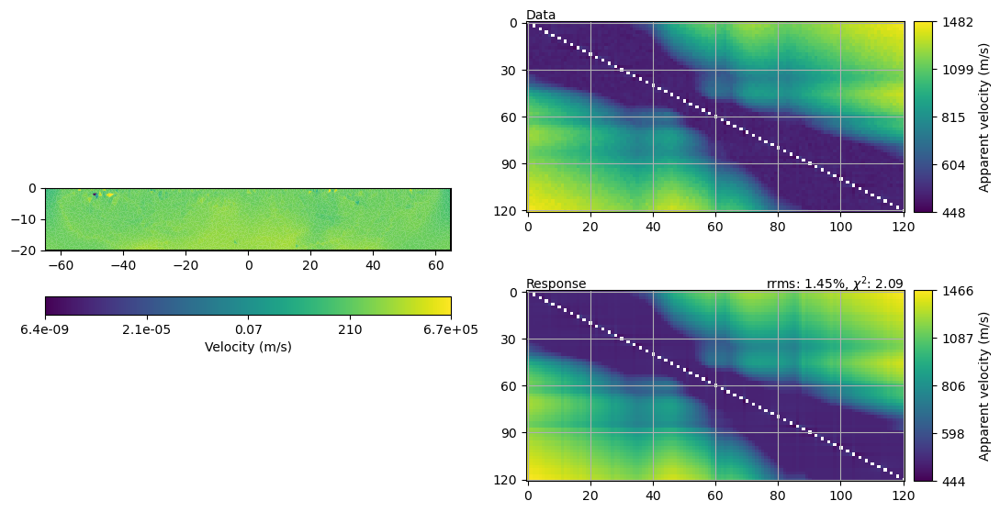

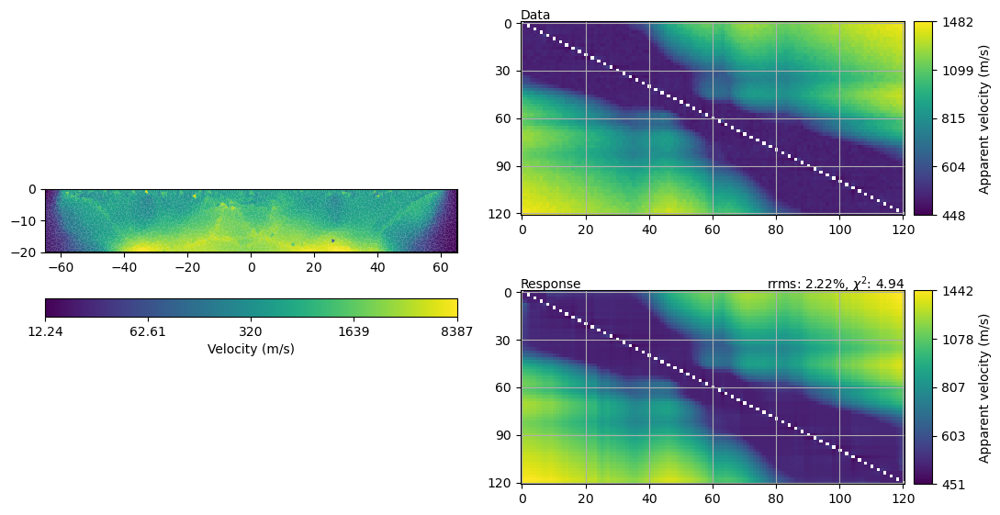

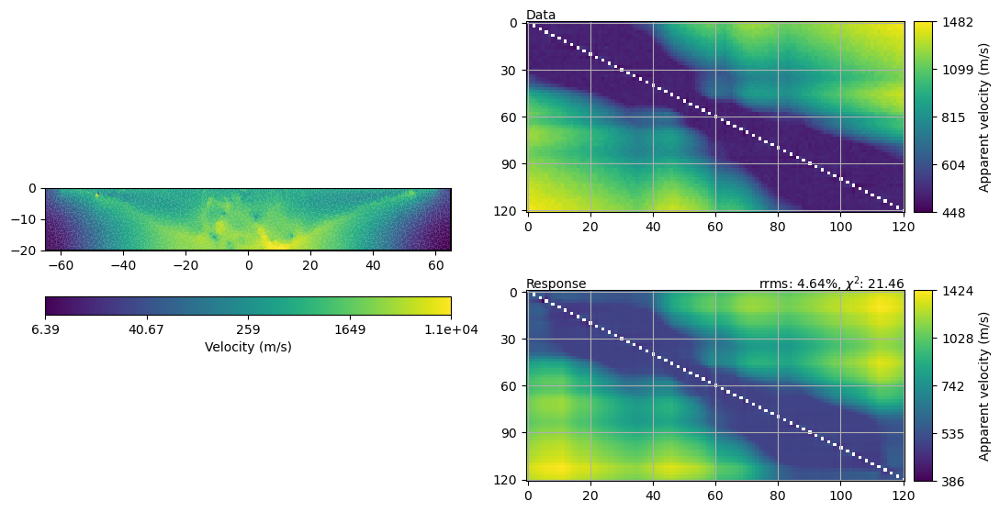

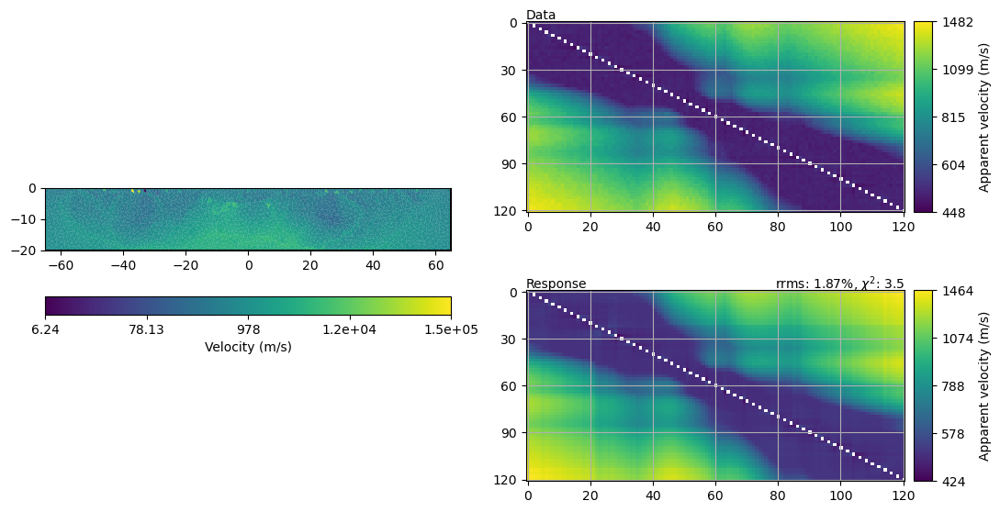

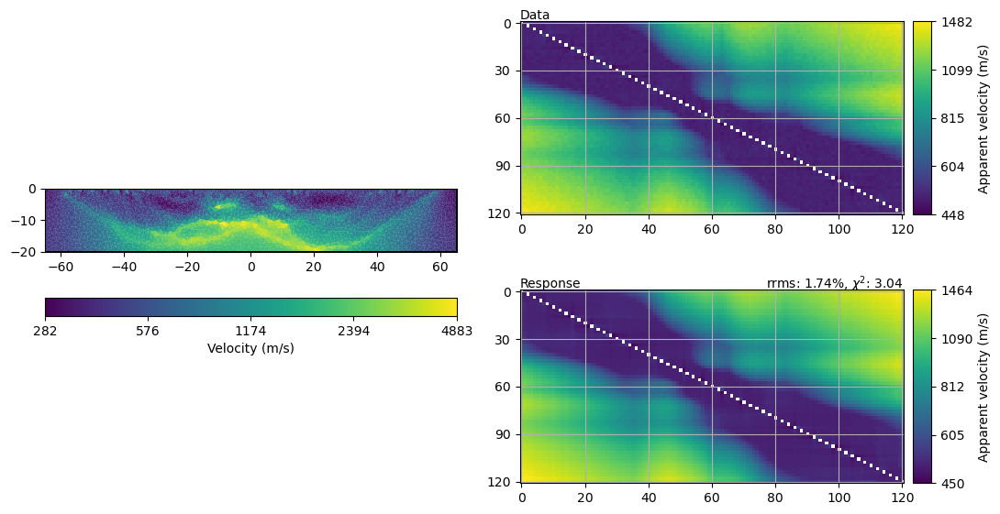

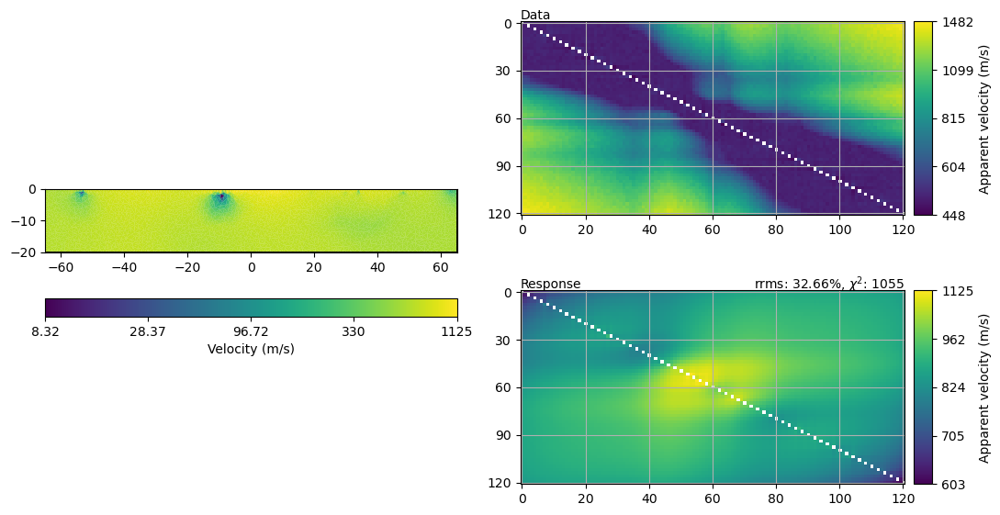

In [6]:
a_list = [0, 50, 200]
lam_list = [1e-7, 1e-5, 1e-3] 
beta = 1e-10

v_me = []
tit  = []

for a in a_list:
    for lam in lam_list:
        SRT2 = TravelTimeManager(tt_data)
        Js = JEI(mgr_list=[SRT2], data_list=[tt_data], mesh=invmesh, order=q, beta=beta, smooth_factor=a)

        KWs = dict(lam=lam, verbose=False, vTop=500, vBottom=4500, secNodes=1)
        Js.setKWInv([KWs])
        Js.setNames(['SRT'])
        
        Js.setReferenceModel([refmod_srt])

        Js.runInversion('MEG', maxIter=20, chi_limit=1.5)
        SRT2.inv.model = 1/SRT2.inv.model
        SRT2.showResultAndFit(cMap=c_srt)

        [v_est] = Js.getModels()
        
        v_me.append(v_est)
        tit.append(f'lam={lam}, a={a}')

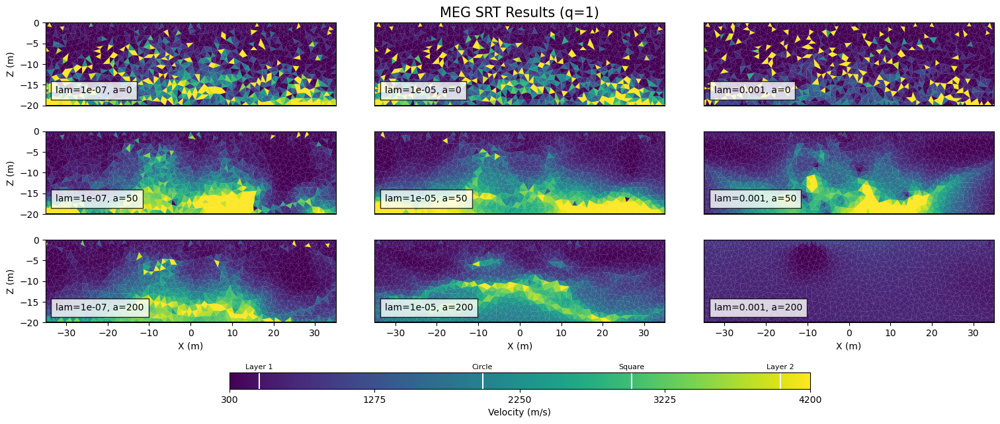

In [7]:
fig, ax = plt.subplots(3,3, figsize=(15,5))
fig.tight_layout(pad=0.5)
ax[0,1].set_title(f'MEG SRT Results (q={q})', fontsize = 15)
for i in np.arange(3):
    for j in np.arange(3):
        pg.show(invmesh, v_me[i*3+j], ax=ax[i,j], 
                cMap=c_srt, cMin=lim_srt[0], cMax=lim_srt[1], 
                colorBar=False, logScale=False)
        
        ax[i,j].text(-32.5, -17, tit[i*3+j], fontsize=10,
                     bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
        ax[i,j].set_xlim(-35,35)
        ax[i,j].set_ylim(-20,0)

# Adjust axis labels
for axis in ax[:,0]:
    axis.set_ylabel('Z (m)')
for axis in ax[-1,:]:
    axis.set_xlabel('X (m)')
for axis_ar in ax[:2,:]:
    for axis in axis_ar:
        axis.set_xticks([])
for axis_ar in ax[:,1:]:
    for axis in axis_ar:
        axis.set_yticks([])

# Add colorbar
cax = ax[2,1].inset_axes([-0.5, -0.8, 2, 0.2])
createColorBarOnly(ax=cax, cMin=lim_srt[0], cMax=lim_srt[1], logScale=False,cMap=c_srt,
                  label=pg.unit('vel'), orientation='horizontal')
for i, v in enumerate([v_left, v_right, v_layer1, v_layer2]):
    cax.plot([v]*2, [0,1], 'w')
    cax.text(v, 1.3, srt_label[i], fontsize=8, horizontalalignment='center', verticalalignment='center')

# plt.savefig(f'C:/Users/azieg/Desktop/GIT_repositories/APG-MSc-Project-Ziegon/Figures/Ch-4/Comp_MEG_lam_a_q{q}_SRT.pdf', 
#             bbox_inches='tight',
#             dpi=600)